In [11]:
from imageprocessor import Imageprocessor
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [7]:
imageprocessor = Imageprocessor()

Initializing lane finder ..
Done ...


In [8]:
image_top_left = (595,448)
image_top_right = (685,448)
image_bottom_left = (252, 678)
image_bottom_right = (1054,678)

birdeye_top_left = (400,20)
birdeye_top_right = (890,20)
birdeye_bottom_left = (400, 700)
birdeye_bottom_right = (890,700)

src = np.float32([image_top_left,image_bottom_left,image_top_right,image_bottom_right])
dst = np.float32([birdeye_top_left,birdeye_bottom_left,birdeye_top_right,birdeye_bottom_right])
imageprocessor.set_perspective_transform(src,dst)

(array([[ -3.77837976e-01,  -1.51829178e+00,   8.77248790e+02],
        [ -5.27355937e-15,  -1.87611474e+00,   8.39111427e+02],
        [ -6.93889390e-18,  -2.38705092e-03,   1.00000000e+00]]),
 array([[  1.78999577e-01,  -8.12205147e-01,   5.24503457e+02],
        [ -1.11022302e-15,  -5.33016440e-01,   4.47260186e+02],
        [ -1.73472348e-18,  -1.27233738e-03,   1.00000000e+00]]))

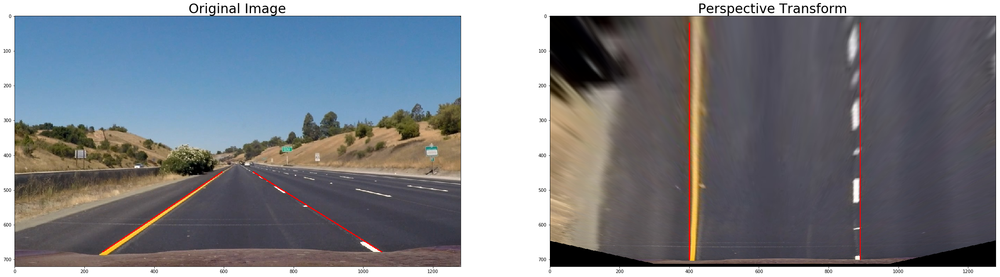

In [9]:
image = mpimg.imread("../test_images/straight_lines1.jpg")
warped = imageprocessor.perspective_transform(image)
cv2.line(image,image_top_left,image_bottom_left, [255, 0, 0], 2)
cv2.line(image,image_top_right,image_bottom_right, [255, 0, 0], 2)
cv2.line(warped,birdeye_top_left,birdeye_bottom_left, [255, 0, 0], 2)
cv2.line(warped,birdeye_top_right,birdeye_bottom_right, [255, 0, 0], 2)

f, (ax11, ax12) = plt.subplots(1, 2, figsize=(40,20))
ax11.imshow(image)
ax11.set_title('Original Image', fontsize=30)
ax12.imshow(warped)
ax12.set_title('Perspective Transform', fontsize=30)
plt.show()

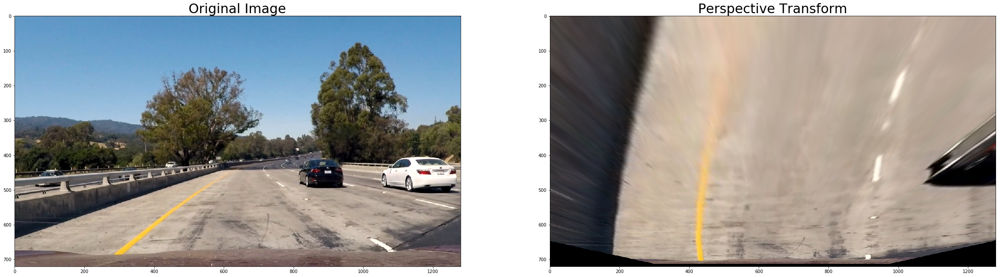

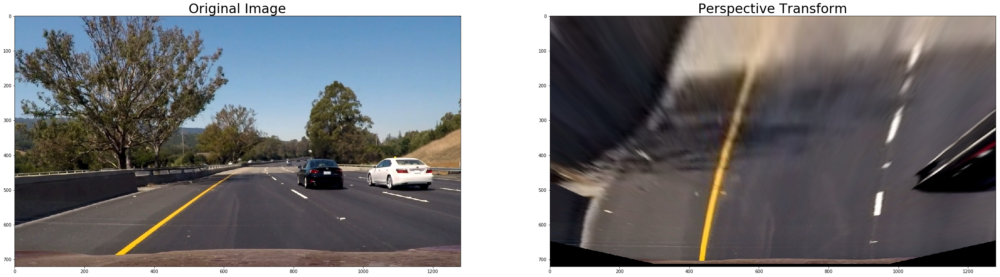

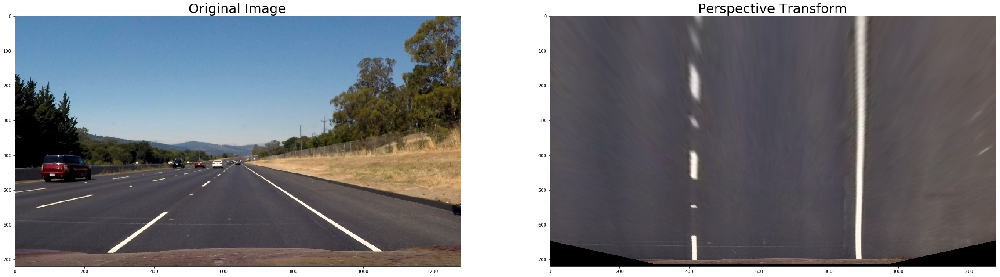

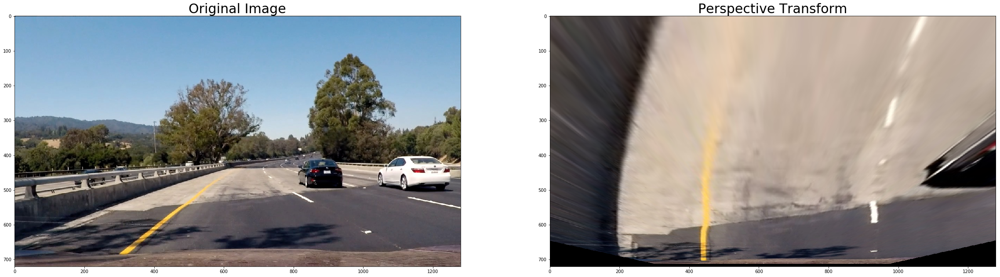

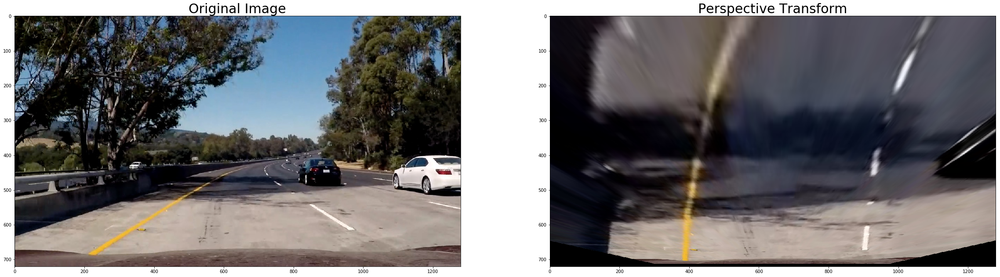

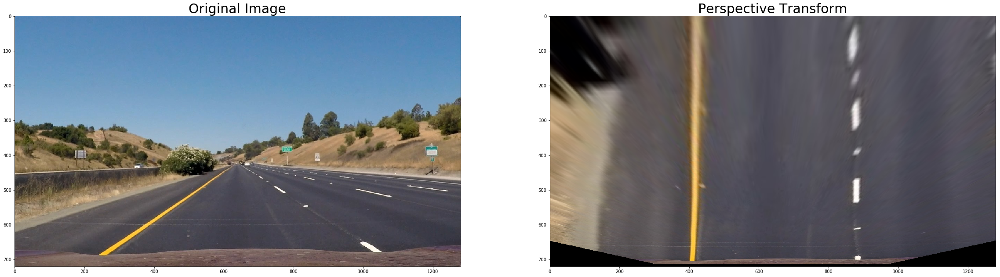

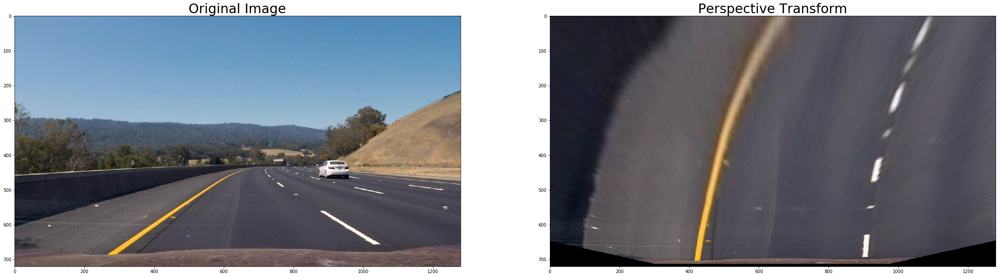

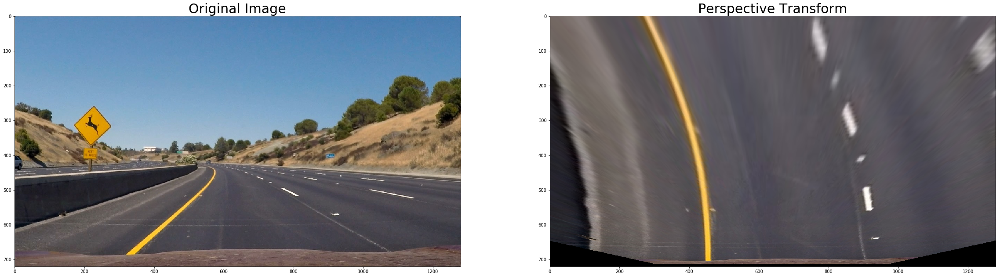

In [10]:
test_images_folder = "../test_images/"
for image_link in os.listdir(test_images_folder):
    
    test_image = mpimg.imread(test_images_folder+image_link)
    test_warped = imageprocessor.perspective_transform(test_image)
    
    f, (ax11, ax12) = plt.subplots(1, 2, figsize=(40,20))
    ax11.imshow(test_image)
    ax11.set_title('Original Image', fontsize=30)
    ax12.imshow(test_warped)
    ax12.set_title('Perspective Transform', fontsize=30)
    plt.show()